# Projet numérique de science des données - MAZOR Orel et CLERGÉ Maxime

## Introduction au projet

Il s'agit de construire un modèle prédisant le type de couvert végétal d'une parcelle de forêt (carré de 30m x 30m) à partir d'informations cartographiques décrivant cette parcelle.

Le but final sera d'appliquer ce modèle pour faire des prédictions pour des données pour lesquelles vous ne disposez pas d'une étiquette. __La note finale portera largement plus sur votre démarche (notebook et ses commentaires) que sur la qualité de vos prédictions.__ 

__Consignes :__ 
* Déclarez votre binôme en vous inscrivant dans un groupe de rendu de projet [sur Moodle](https://moodle.psl.eu/course/view.php?id=22890) afin de récupérer le fichier pour lequel vous devrez faire des prédictions.
* Vous devrez rendre, par groupe de projet :
    * un notebook jupyter
    * un fichier de prédictions (voir plus bas pour le format)
* __Renseignez vos noms & prénoms__ dans le titre du notebook
* Vous avez jusqu'au __5 juillet midi heure de Paris__
* Déposez vos fichiers [sur Moodle](https://moodle.psl.eu/course/view.php?id=22890) dans la section dédiée (un seul rendu par binôme est nécessaire).

__Déroulé :__
* Les séances du lundi 17/06 (10h45-12h15) et lundi 01/07 (10h45-12h15) sont dédiées au projet numérique. Faites-en bon usage.
* Certaines sections font appel à des notions qui n'auront pas encore été vues le 17/06 ; c'est indiqué le cas échéant.

## Données

### Description des données 
Le dossier `data/` contient un jeu de données nommé `couvert_vegetal_public.tsv`. Il contient les données étiquetées à partir desquelles construire votre modèle.

Chaque ligne dans les données correspond à un carré de 30 m x 30m, décrit par les variables suivantes :
* variables continues :
  * `altitude` : altitude en mètres
  * `pente` : pente en degrés
  * `distance_horizontale_hydro` : distance horizontale au point d'eau le plus proche (en mètres)
  * `distance_verticale_hydro` : distance verticale au point d'eau le plus proche (en mètres)
  * `distance_horizontale_route` : distance horizontale à la route la plus proche (en mètres)
  * `ombrage_0900` : index d'ombrages à 9h du matin, au solstice, sur une échelle de 0 à 255
  * `ombrage_1200` : index d'ombrages à midi, au solstice, sur une échelle de 0 à 255
  * `ombrage_1500` : index d'ombrages à 15h, au solstice, sur une échelle de 0 à 255
  * `distance_horizontale_depart_feu` : distance horizontale au départ de feu de forêt le plus proche (en mètres)
* variables binaires
  * `zone_A` : 0 ou 1, selon si la parcelle appartient à une zone géographique A ou non
  * `couvert` (étiquette) : nature du couvert végétal (0 = sapin ou épicéa ; 1 = pin tordu)

### Chargement des données étiquetées

In [1]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

In [2]:
import pandas as pd

/var/folders/z1/tww70wl50msc5nx930r4vsz80000gn/T/ipykernel_12577/4080736814.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
df_public = pd.read_csv('data/couvert_vegetal_public.tsv', delimiter='\t')

In [4]:
df_public.head()

,altitude,pente,distance_horizontale_hydro,distance_verticale_hydro,distance_horizontale_route,ombrage_0900,ombrage_1200,ombrage_1500,distance_horizontale_depart_feu,zone_A,couvert
0,2859,16,739,127,150,175,228,192,1590,0,1
1,3024,8,42,4,1261,205,246,179,957,0,1
2,3057,9,295,68,2581,198,230,171,1959,0,1
3,2802,12,120,14,446,240,223,112,2582,0,1
4,2880,20,190,71,1317,194,254,193,2698,0,1


In [5]:
df_public.shape

(5000, 11)

### Visualisation des variables

#### Question 1
Visualisez chacun des descripteurs (_features_) sous la forme de deux histogrammes superposés (grâce à [pyplot.hist](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html)), l'un correspondant aux observations de la classe positive, l'autre correspondant aux observations de la classe négative

__Conseils :__
* utilisez `df_public.loc[df_public["couvert"]==1]` pour obtenir les lignes de `df_public` pour lesquelles `couvert` vaut `1`.
* utilisez l'argument `alpha` de `plt.hist` pour rendre vos histogrammes transparents.

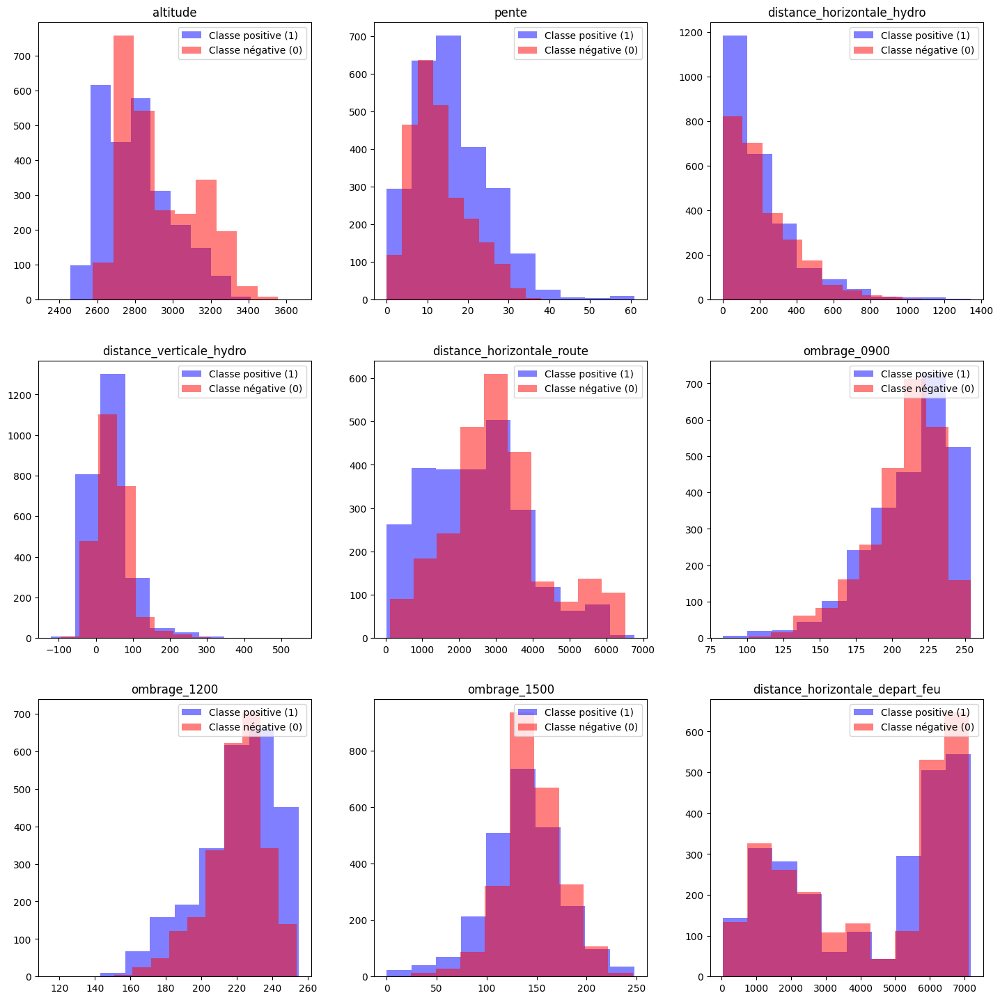

In [6]:
# Question 1

# Séparer les observations selon la classe
df_positive = df_public.loc[df_public['couvert'] == 1]
df_negative = df_public.loc[df_public['couvert'] == 0]

# Liste des descripteurs continus
features = [
    'altitude', 'pente', 'distance_horizontale_hydro', 'distance_verticale_hydro',
    'distance_horizontale_route', 'ombrage_0900', 'ombrage_1200', 'ombrage_1500',
    'distance_horizontale_depart_feu'
]

# Créer une figure avec une grille de sous-graphiques
fig = plt.figure(figsize=(15, 15))

# Tracer les histogrammes pour chaque descripteur continu
for idx, feature in enumerate(features):
    ax = fig.add_subplot(3, 3, (idx+1))
    ax.hist(df_positive[feature], alpha=0.5, label='Classe positive (1)', color='blue')
    ax.hist(df_negative[feature], alpha=0.5, label='Classe négative (0)', color='red')
    ax.set_title(feature)
    ax.legend(loc='upper right')

# Espacement entre les subplots
fig.tight_layout(pad=3.0)

# Afficher les graphiques
plt.show()


#### Question 2
Pensez-vous qu'il va être aisé de distinguer les deux classes ?

Les deux classes se superposent souvent, il n'a pas l'air évident de les distinguer à première vue.

### Visualisation en 2D

Commençons par extraire la matrice de design `X_public` (numpy.array) de `df_public` :

In [7]:
# Extraction de la matrice de design
X_public = np.array(df_public.drop(columns=["couvert"]))

#### Question 3
a) Utilisez une ACP pour visualiser les données en deux dimensions. Plus précisément : utilisez une ACP des descripteurs (_features_) pour représenter les observations sous la forme d'un nuage de points en 2D, et colorez les points selon leur étiquette.

b) À quelle point cette ACP est-elle une représentation fidèle des données ? 

c) Pensez-vous maintenant qu'il va être aisé de distinguer les deux classes ? Pourquoi ?

#### Réponse question a

In [8]:
from sklearn import preprocessing
std_scale = preprocessing.StandardScaler().fit(X_public)
X_scaled = std_scale.transform(X_public)

In [9]:
from sklearn import decomposition
pca = decomposition.PCA(n_components=2)
pca.fit(X_scaled)
X_projected = pca.transform(X_scaled)

Text(0, 0.5, 'PC 2')

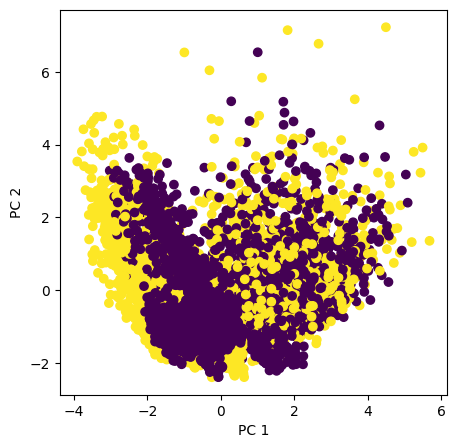

In [10]:
fig = plt.figure(figsize=(5, 5))

plt.scatter(X_projected[:, 0], X_projected[:, 1], c=df_public['couvert'])

plt.xlabel("PC 1")
plt.ylabel("PC 2")

#### Réponse question b

In [11]:
pca_tot = decomposition.PCA(n_components=10)
pca_tot.fit(X_scaled)

PCA(n_components=10)

Text(0.5, 1.0, 'Proportion cumulative de variance expliquée')

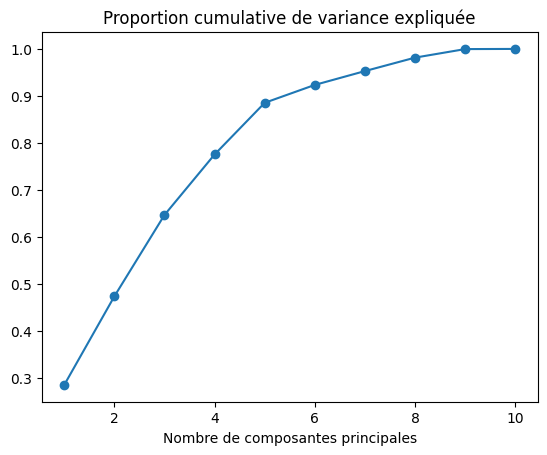

In [12]:
plt.plot(np.arange(1, 11), np.cumsum(pca_tot.explained_variance_ratio_), marker='o')

plt.xlabel("Nombre de composantes principales")
plt.title("Proportion cumulative de variance expliquée")

La proportion cumulative de variance expliquée des deux premières PCA est de 0.5, cela donne une représentation assez fidèle des données.

#### Réponse question c

Les ACP des deux classes se superposent toujours, la PCA n'est pas suffisante pour les distinguer ici.

## [À partir de la PC 3] Apprentissage supervisé

Nous allons maintenant avoir besoin du vecteur d'étiquettes `y_public` sous forme d'array numpy :

In [13]:
y_public = np.array(df_public["couvert"])

### Quantification des performances

Il existe de nombreux scores permettant d'évaluer les performances d'un algorithme de classification. Toutes celles implémentées dans scikit-learn sont listées [ici](https://scikit-learn.org/stable/modules/model_evaluation.html#classification-metrics).

Dans ce projet, nous allons utiliser la **proportion d'observations correctement classifiées**, ou _accuracy_ en anglais (à ne pas confondre avec la _precision_). Elle est implémentée par [metrics.accuracy_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html) dans scikit-learn.

#### Question 4

a) Quel serait sur nos données l'accuracy d'un modèle naïf prédisant systématiquement la classe 1 ?

b) Supposons maintenant que le jeu de données sur lequel on évalue ce même modèle naïf comporte 9 fois plus d'exemples de la classe 1 que de la classe 0 (90% de `1`, 10% de `0`). Quel serait alors son accuracy ?

c) Quelle serait la [balanced accuracy](https://scikit-learn.org/stable/modules/model_evaluation.html#balanced-accuracy-score) du modèle naïf sur le jeu de données de la question b) ?

In [14]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score

In [15]:
# Question a

y_pred_naive = np.ones_like(y_public)

# Calculer l'accuracy
accuracy_naive = accuracy_score(y_public, y_pred_naive)
accuracy_naive

0.5

In [211]:
# Question b

# Création du jeu de données avec 90% de classe 1 et 10% de classe 0
n_samples = len(df_public)
y_public_90_10 = np.array([1] * int(0.9 * n_samples) + [0] * int(0.1 * n_samples))
y_pred_naive_90_10 = np.ones_like(y_public_90_10)

# Calculer l'accuracy
accuracy_naive_bis = accuracy_score(y_public_90_10, y_pred_naive_90_10)
accuracy_naive_bis

0.9

In [17]:
# Question c

balanced_accuracy_naive_bis = balanced_accuracy_score(y_public_90_10, y_pred_naive_90_10)
balanced_accuracy_naive_bis

0.5

Commentaire : 
L'accuracy_score est la proportion d'exemples correctement étiquetés, c'est 90% dans le cas qui précède(la prédiction contient 100% de 1, la variable 90%).
La balanced_accuracy_score est la moyenne de la sensibilité (taux de vrais négatifs, 0 ici car on ne prédit que du 1) et du rappel (taux de vrais positifs, 1 ici), elle sera donc bien de 1/2 comme affiché.

### Algorithme des 7 plus proches voisins

Nous n'avons pas encore vu d'algorithme permettant d'entraîner un modèle de classification. Nous allons donc commencer avec un modèle simple : celui des __k plus proches voisins__ (ou __kNN__, pour _k nearest neighbors_).

Dans ce modèle, la valeur de la fonction de décision en x est la proportion d'individus d'étiquette positive parmi les k plus proches voisins de x au sein des points du jeu d'entraînement ; k est fixé.

Nous allons commencer par utiliser un algorithme des k plus proches voisins avec k fixé à k=7.

#### Question 5

a) Utilisez la classe `KNeighborsClassifier` du module `neighbors` de `sklearn` pour entraîner un modèle avec l'algorithme des 7 plus proches voisins sur les données `(X_public, y_public)`.

Documentation : [sklearn.neighbors.KNeighborsClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html)

b) Quelle est l'accuracy de ce modèle sur le jeu ayant servi à l'entraîner ?

In [18]:
from sklearn import metrics, neighbors

In [66]:
# Créer le modèle kNN avec k=7
knn = neighbors.KNeighborsClassifier(n_neighbors=7)

# Entraîner le modèle sur les données d'entraînement
knn.fit(X_public, y_public)

KNeighborsClassifier(n_neighbors=7)

In [67]:
# Prédire les étiquettes sur le jeu de données d'entraînement
y_pred = knn.predict(X_public)

In [68]:
accuracy = accuracy_score(y_public, y_pred)
accuracy

0.918

In [69]:
balanced_accuracy = balanced_accuracy_score(y_public, y_pred)
balanced_accuracy

0.9179999999999999

#### Pré-traitement des données

#### Question 6

Les variables du jeu de données prennent des valeurs sur des échelles différentes (voir par exemple `pente` vs `distance_horizontale_route` vs `zone_A`).

a) Quel effet cela peut-il avoir sur le calcul des plus proches voisins ?

b) Proposez et implémentez un pré-traitement permettant de remédier à ce problème : créez une nouvelle représentation des données publiques `X_public_preprocessed`, entraînez un algorithme des 7 plus proches voisins, et évaluez sa performance sur le jeu d'entraînement. 

In [70]:
X_public_preprocessed = X_scaled

In [71]:
knn_new = neighbors.KNeighborsClassifier(n_neighbors=7)
knn_new.fit(X_public_preprocessed, y_public)
y_pred_new = knn_new.predict(X_public_preprocessed)
accuracy_new = accuracy_score(y_public, y_pred_new)
accuracy_new

0.9066

In [72]:
balanced_accuracy_new = balanced_accuracy_score(y_public, y_pred_new)
balanced_accuracy_new

0.9066000000000001

Commentaires : 
- L'accuracy est meilleure sur le jeu de données non normalisé, ce qui est difficilement explicable. On choisira toit de même le modèle à partir d'une analyse sur des données normalisées.

- L'accuracy et la balanced_accuracy sont à peu près égales : le jeu de données est donc assez équilibré, on utilise uniquement l'accuracy dans la suite pour comparer les modèles.

### [À partir de l'Amphi 6 / PC4] Mise en place d'une validation croisée 

Nous allons maintenant mettre en place une procédure de validation croisée pour évaluer/comparer différents modèles. Plus précisément, nous fixons le découpage du jeu de données en 5 _folds_, que nous réutiliserons pour chaque évaluation dans ce qui suit :

In [36]:
from sklearn import model_selection

In [74]:
n_folds = 5
kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=42)

### Algorithme des k plus proches voisins

#### Question 8 

a) Utilisez `kf` pour évaluer l'accuracy en validation croisée de l'algorithme des 7 plus proches voisins. 

b) Comparez à l'accuracy obtenue sur le jeu d'entraînement ; commentez.

In [75]:
# loop over the different folds
scores = []
for i, (train_index, test_index) in enumerate(kf.split(X_public)):
    print("fold: {0} | nb_train: {1} | nb_test: {2}".format(i, len(train_index), len(test_index)))

    # get train and validation dataset
    X_train = X_scaled[train_index]
    X_test = X_scaled[test_index]
    y_train = y_public[train_index]
    y_test = y_public[test_index]
    
    # train model
    knn_cross = neighbors.KNeighborsClassifier(n_neighbors=7)

    knn_cross.fit(X_train, y_train)
    
    # measure performance (here, R2)
    accuracy_score_test = accuracy_score(y_test, knn_cross.predict(X_test))
    scores.append(accuracy_score_test)
    print("\r Accuracy (test): {0:0.3f}".format(accuracy_score_test))
    
print()

# performance on the test set
average_score = np.mean(scores)
std_score = np.std(scores)
print("Average accuracy (test): {0:0.3f}".format(average_score))
print("Standard deviation accuracy (test): {0:0.3f}".format(std_score), "\n")

fold: 0 | nb_train: 4000 | nb_test: 1000
 Accuracy (test): 0.864
fold: 1 | nb_train: 4000 | nb_test: 1000
 Accuracy (test): 0.834
fold: 2 | nb_train: 4000 | nb_test: 1000
 Accuracy (test): 0.886
fold: 3 | nb_train: 4000 | nb_test: 1000
 Accuracy (test): 0.851
fold: 4 | nb_train: 4000 | nb_test: 1000
 Accuracy (test): 0.861

Average accuracy (test): 0.859
Standard deviation accuracy (test): 0.017 



L'accuracy obtenue est légèrement plus faible que sur le jeu d'entraînement, ce qui montre un surraprentissage de l'algorithme (pas excessif).

#### Question 9

a) Évaluez la performance en validation croisée de l'algorithmes des k plus proches voisins, pour k variant de 1 à 19. Faites un graphe pour présenter les résultats.

b) Quelle valeur de k sélectionner pour faire des prédictions sur de nouvelles données ?

In [76]:
def accuracy_func_knn(n_folds,k) : 
    kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=42)
    scores = []
    for i, (train_index, test_index) in enumerate(kf.split(X_scaled)):
        
        # get train and validation dataset
        X_train = X_scaled[train_index]
        X_test = X_scaled[test_index]
        y_train = y_public[train_index]
        y_test = y_public[test_index]
                        
        # train model
        knn_cross = neighbors.KNeighborsClassifier(n_neighbors=k)
        
        knn_cross.fit(X_train, y_train)
                    
        accuracy_score_test = accuracy_score(y_test, knn_cross.predict(X_test))
        scores.append(accuracy_score_test)

    return np.mean(scores)

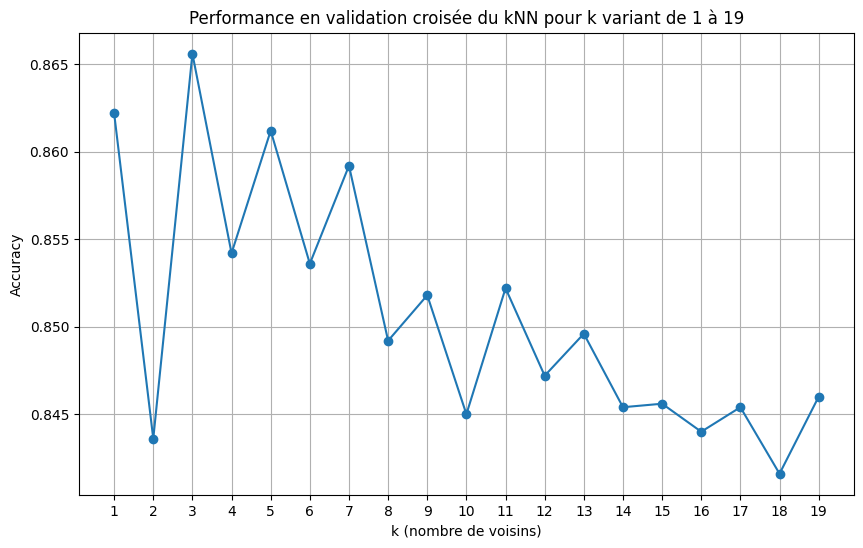

In [77]:
# Évaluer les performances pour k variant de 1 à 19
k_values = range(1, 20)
accuracy_scores = [accuracy_func_knn(5, k) for k in k_values]

# Tracer les résultats
plt.figure(figsize=(10, 6))
plt.plot(k_values, accuracy_scores, marker='o')
plt.xticks(k_values)  # Définir les valeurs de l'axe des x comme des entiers
plt.xlabel('k (nombre de voisins)')
plt.ylabel('Accuracy')
plt.title('Performance en validation croisée du kNN pour k variant de 1 à 19')
plt.grid()
plt.show()

On prendra k = 3 pour faire des prédictions sur de nouvelles données avec cet algorithme.

### Modèle linéaire 

#### Question 10

Évaluez l'accuracy en validation croisée d'une régression logistique sur le jeu d'entraînement. Sélectionnez le ou les hyperparamètres pertinents si nécessaire.

Comparez à l'accuracy du modèle de k plus proches voisins.

Documentation : [sklearn.linear_model.LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

In [31]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV

In [79]:
logistic_model = linear_model.LogisticRegression()
# Define parameter grid
C_values = np.linspace(0.1, 2, 20)
C_values = np.concatenate(([1e-6],[1e6], C_values))
param_grid_log2 = {
    'C': C_values,
    'penalty': ['l2']
}

# Define grid search
nb_folds = 5
grid_log2 = GridSearchCV(logistic_model, param_grid_log2, cv=nb_folds, refit=False, verbose=3)

# Run grid search
grid_log2.fit(X_scaled, y_public)

# Get scores
scores_log2 = grid_log2.cv_results_['mean_test_score']
scores_std_log2 = grid_log2.cv_results_['std_test_score']

# Compute standard errors
std_error_log2 = scores_std_log2 / np.sqrt(nb_folds)

# Find best parameters
best_index_log2 = np.argmax(scores_log2)
best_params_log2 = grid_log2.cv_results_['params'][best_index_log2]
best_score_log2 = scores_log2[best_index_log2]

best_params_log2


Fitting 5 folds for each of 22 candidates, totalling 110 fits
[CV 1/5] END ...............C=1e-06, penalty=l2;, score=0.565 total time=   0.0s
[CV 2/5] END ...............C=1e-06, penalty=l2;, score=0.606 total time=   0.0s
[CV 3/5] END ...............C=1e-06, penalty=l2;, score=0.416 total time=   0.0s
[CV 4/5] END ...............C=1e-06, penalty=l2;, score=0.773 total time=   0.0s
[CV 5/5] END ...............C=1e-06, penalty=l2;, score=0.774 total time=   0.0s
[CV 1/5] END ...........C=1000000.0, penalty=l2;, score=0.712 total time=   0.0s
[CV 2/5] END ...........C=1000000.0, penalty=l2;, score=0.718 total time=   0.0s
[CV 3/5] END ...........C=1000000.0, penalty=l2;, score=0.583 total time=   0.0s
[CV 4/5] END ...........C=1000000.0, penalty=l2;, score=0.840 total time=   0.0s
[CV 5/5] END ...........C=1000000.0, penalty=l2;, score=0.828 total time=   0.0s
[CV 1/5] END .................C=0.1, penalty=l2;, score=0.716 total time=   0.0s
[CV 2/5] END .................C=0.1, penalty=l2

{'C': 0.7, 'penalty': 'l2'}

In [80]:
logistic_model = linear_model.LogisticRegression(solver='liblinear')
C_values = np.linspace(0.1, 2, 20)
C_values = np.concatenate(([1e-6],[1e6], C_values)) 
param_grid_log1 = {
    'C': C_values,
    'penalty': ['l1']  
}
# define gridsearch
nb_folds = 5
grid_log1 = GridSearchCV(logistic_model, param_grid_log1, cv=nb_folds, refit=False, verbose=3)

# run gridsearch 
grid_log1.fit(X_scaled, y_public)

# get score
scores_log1 = grid_log1.cv_results_['mean_test_score']
scores_std_log1 = grid_log1.cv_results_['std_test_score']

# Compute standard errors
std_error_log1 = scores_std_log1 / np.sqrt(nb_folds)

# Find best parameters
best_index_log1 = np.argmax(scores_log1)
best_params_log1 = grid_log1.cv_results_['params'][best_index_log2]
best_score_log1 = scores_log1[best_index_log1]

best_params_log1

Fitting 5 folds for each of 22 candidates, totalling 110 fits
[CV 1/5] END ...............C=1e-06, penalty=l1;, score=0.500 total time=   0.0s
[CV 2/5] END ...............C=1e-06, penalty=l1;, score=0.500 total time=   0.0s
[CV 3/5] END ...............C=1e-06, penalty=l1;, score=0.500 total time=   0.0s
[CV 4/5] END ...............C=1e-06, penalty=l1;, score=0.500 total time=   0.0s
[CV 5/5] END ...............C=1e-06, penalty=l1;, score=0.500 total time=   0.0s
[CV 1/5] END ...........C=1000000.0, penalty=l1;, score=0.712 total time=   0.2s
[CV 2/5] END ...........C=1000000.0, penalty=l1;, score=0.718 total time=   0.2s
[CV 3/5] END ...........C=1000000.0, penalty=l1;, score=0.582 total time=   0.1s
[CV 4/5] END ...........C=1000000.0, penalty=l1;, score=0.840 total time=   0.2s
[CV 5/5] END ...........C=1000000.0, penalty=l1;, score=0.828 total time=   0.2s
[CV 1/5] END .................C=0.1, penalty=l1;, score=0.710 total time=   0.0s
[CV 2/5] END .................C=0.1, penalty=l1

{'C': 0.7, 'penalty': 'l1'}

Note : la régularisation semble inutile ici, on obtient une accuracy similaire avec C = +inf qu'avec le C optimal dans les cas l2 et l1, on va faire de la validation croisée sans régularisation.

In [81]:
def accuracy_func_linear(n_folds) : 
    kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=42)
    scores = []
    for i, (train_index, test_index) in enumerate(kf.split(X_scaled)):
        
        # get train and validation dataset
        X_train = X_scaled[train_index]
        X_test = X_scaled[test_index]
        y_train = y_public[train_index]
        y_test = y_public[test_index]
                        
        # train model
        logistic_model = linear_model.LogisticRegression()
        
        logistic_model.fit(X_train, y_train)
                    
        accuracy_score_test = accuracy_score(y_test, logistic_model.predict(X_test))
        scores.append(accuracy_score_test)

    return np.mean(scores)

In [82]:
accuracy_func_linear(5)

0.7722000000000001

### [À partir de l'Amphi 8] Modèle non-linéaire

#### Question 11

Choisissez un algorithme permettant d'apprendre un modèle de classification non-linéaire.

Évaluez son accuracy en validation croisée sur le jeu d'entraînement. Sélectionnez le ou les hyperparamètres pertinents si nécessaire.

Comparez aux accuracies obtenues jusqu'à présent.

In [29]:
from sklearn import svm

In [83]:
# Définir le modèle SVM avec kernel RBF
svm_model = svm.SVC(kernel='rbf')

# Définir la grille de paramètres
param_grid_svm = {
    'C': np.logspace(-3, 2, 6),  # Paramètre de régularisation
    'gamma': np.logspace(-3, 2, 6)  # Paramètre du kernel RBF
}

# Configurer GridSearchCV
nb_folds = 5
grid_svm = GridSearchCV(svm_model, param_grid_svm, cv=nb_folds, refit=False, verbose=3)

# Effectuer la recherche en grille
grid_svm.fit(X_scaled, y_public)

# Obtenir les scores
scores_svm = grid_svm.cv_results_['mean_test_score']
scores_std_svm = grid_svm.cv_results_['std_test_score']

# Calculer les erreurs standard
std_error_svm = scores_std_svm / np.sqrt(nb_folds)

# Obtenir les meilleurs paramètres
best_index_svm = np.argmax(scores_svm)
best_params_svm = grid_svm.cv_results_['params'][best_index_svm]
best_score_svm = scores_svm[best_index_svm]
best_params_svm

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END ..............C=0.001, gamma=0.001;, score=0.555 total time=   1.3s
[CV 2/5] END ..............C=0.001, gamma=0.001;, score=0.592 total time=   1.3s
[CV 3/5] END ..............C=0.001, gamma=0.001;, score=0.413 total time=   1.3s
[CV 4/5] END ..............C=0.001, gamma=0.001;, score=0.810 total time=   1.3s
[CV 5/5] END ..............C=0.001, gamma=0.001;, score=0.776 total time=   1.3s
[CV 1/5] END ...............C=0.001, gamma=0.01;, score=0.557 total time=   1.3s
[CV 2/5] END ...............C=0.001, gamma=0.01;, score=0.592 total time=   1.5s
[CV 3/5] END ...............C=0.001, gamma=0.01;, score=0.413 total time=   1.3s
[CV 4/5] END ...............C=0.001, gamma=0.01;, score=0.826 total time=   1.3s
[CV 5/5] END ...............C=0.001, gamma=0.01;, score=0.755 total time=   1.3s
[CV 1/5] END ................C=0.001, gamma=0.1;, score=0.645 total time=   1.3s
[CV 2/5] END ................C=0.001, gamma=0.1

{'C': 10.0, 'gamma': 0.1}

In [84]:
def accuracy_func_svm(n_folds) : 
    kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=42)
    scores = []
    for i, (train_index, test_index) in enumerate(kf.split(X_scaled)):
        
        # get train and validation dataset
        X_train = X_scaled[train_index]
        X_test = X_scaled[test_index]
        y_train = y_public[train_index]
        y_test = y_public[test_index]
                        
        # train model
        svm_model = svm.SVC(kernel='rbf', C = 10, gamma = 0.1)
        
        svm_model.fit(X_train, y_train)
                    
        accuracy_score_test = accuracy_score(y_test, svm_model.predict(X_test))
        scores.append(accuracy_score_test)

    return np.mean(scores)

In [85]:
accuracy_func_svm(5)

0.8587999999999999

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [87]:
rf_model = RandomForestClassifier(random_state=42)

# Définir la grille de paramètres
param_grid_rf = {
    'n_estimators': np.arange(100, 501, 50),
    'max_depth': [None, 10, 20, 30]
}

# Configurer GridSearchCV
nb_folds = 5
grid_rf = GridSearchCV(rf_model, param_grid_rf, cv=nb_folds, refit=False, verbose=3)

# Effectuer la recherche en grille
grid_rf.fit(X_scaled, y_public)

# Obtenir les scores
scores_rf = grid_rf.cv_results_['mean_test_score']
scores_std_rf = grid_rf.cv_results_['std_test_score']

# Calculer les erreurs standard
std_error_rf = scores_std_rf / np.sqrt(nb_folds)

# Obtenir les meilleurs paramètres
best_index_rf = np.argmax(scores_rf)
best_params_rf = grid_rf.cv_results_['params'][best_index_rf]
best_score_rf = scores_rf[best_index_rf]

best_params_rf

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END ..max_depth=None, n_estimators=100;, score=0.736 total time=   0.8s
[CV 2/5] END ..max_depth=None, n_estimators=100;, score=0.698 total time=   0.7s
[CV 3/5] END ..max_depth=None, n_estimators=100;, score=0.563 total time=   0.8s
[CV 4/5] END ..max_depth=None, n_estimators=100;, score=0.943 total time=   0.8s
[CV 5/5] END ..max_depth=None, n_estimators=100;, score=0.774 total time=   0.8s
[CV 1/5] END ..max_depth=None, n_estimators=150;, score=0.743 total time=   1.1s
[CV 2/5] END ..max_depth=None, n_estimators=150;, score=0.697 total time=   1.1s
[CV 3/5] END ..max_depth=None, n_estimators=150;, score=0.564 total time=   1.3s
[CV 4/5] END ..max_depth=None, n_estimators=150;, score=0.946 total time=   1.2s
[CV 5/5] END ..max_depth=None, n_estimators=150;, score=0.775 total time=   1.2s
[CV 1/5] END ..max_depth=None, n_estimators=200;, score=0.742 total time=   1.5s
[CV 2/5] END ..max_depth=None, n_estimators=200

{'max_depth': 10, 'n_estimators': 450}

In [22]:
def accuracy_func_tree(n_folds) : 
    kf = model_selection.KFold(n_splits=n_folds, shuffle=True, random_state=42)
    scores = []
    for i, (train_index, test_index) in enumerate(kf.split(X_scaled)):
        
        # get train and validation dataset
        X_train = X_scaled[train_index]
        X_test = X_scaled[test_index]
        y_train = y_public[train_index]
        y_test = y_public[test_index]
                        
        # train model
        rf_model = RandomForestClassifier(random_state=42,max_depth= 10, n_estimators = 450)
        
        rf_model.fit(X_train, y_train)
                    
        accuracy_score_test = accuracy_score(y_test, rf_model.predict(X_test))
        scores.append(accuracy_score_test)

    return np.mean(scores)

In [89]:
accuracy_func_tree(5)

0.8838000000000001

### Choix du modèle final

#### Question 12
Étant donné le travail mené jusqu'à présent :

a) Quel algorithme d'apprentissage, avec quel(s) hyperparamètres, choisissez-vous pour apprendre votre modèle final ? 

b) Utilisez cet algorithme avec cet/ces hyperparamètres pour entraîner un  modèle `predictor_final` sur l'ensemble des données étiquetées. N'oubliez pas le pré-traitement si nécessaire.

Le modèle retenu est celui de la forêt aléatoire, avec max_depth= 10, n_estimators = 450.

In [23]:
predictor_final = RandomForestClassifier(random_state=42,max_depth= 10, n_estimators = 450)
        
predictor_final.fit(X_public, y_public)

y_pred_f = predictor_final.predict(X_public)

accuracy_f = accuracy_score(y_public, y_pred_f)
accuracy_f

0.967

## Prédictions

Vous recevrez après avoir déclaré votre binôme un jeu de données nommé `couvert_vegetal_prive_<n>.tsv` (ou `<n>` sera un numéro arbitraire). Il contient les données non-étiquetées, pour lesquelles faire vos prédictions. Le format est le même que pour `couvert_vegetal_public.tsv`, à l'exception de la variable `couvert`, que vous devrez prédire.

### Charger les données

Vous pouvez maintenant charger le jeu de données externe (en remplaçant `1` par le bon numéro) :

In [19]:
df_private = pd.read_csv('data/couvert_vegetal_prive_17.tsv', delimiter='\t')
X_private = np.array(df_private)

### Prédictions

#### Question 13
Utilisez `predictor_final` pour prédire les étiquettes des observations de `X_private`.  N'oubliez pas le pré-traitement si nécessaire. Enregistrez le résultat dans un array `y_pred_final`.

In [24]:
y_pred_final = predictor_final.predict(X_private)

In [101]:
y_pred_final

array([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0,

Vous pouvez maintenant utiliser le code suivant pour générer votre fichier de prédictions :

In [103]:
np.savetxt("test_file.tsv", 
           y_pred_final,
           fmt=('%d'), 
           header='Prediction',
           delimiter='\t', comments="")

__Attention !__ Si vous ouvrez ce fichier avec un programme externe type Microsoft Excel ou LibreOffice Calc pour le lire, il est possible que ce programme modifie le fichier sans que vous ne le réalisiez. Préférez utiliser un éditeur de texte simple, ou une commande bash type `less` ou `cat` ; ou alors assurez-vous de relancer la commande avant de soumettre vos prédictions.

## Pour aller plus loin

#### Bonus 1

Ajoutez le jeu de test à la visualisation de la question 3. Pensez-vous que les performances de votre modèle sur le jeu de test vont être
* aussi bonnes qu'en validation croisée sur le jeu d'entraînement ?
* meilleures ?
* moins bonnes ?

Text(0.5, 1.0, 'Proportion cumulative de variance expliquée')

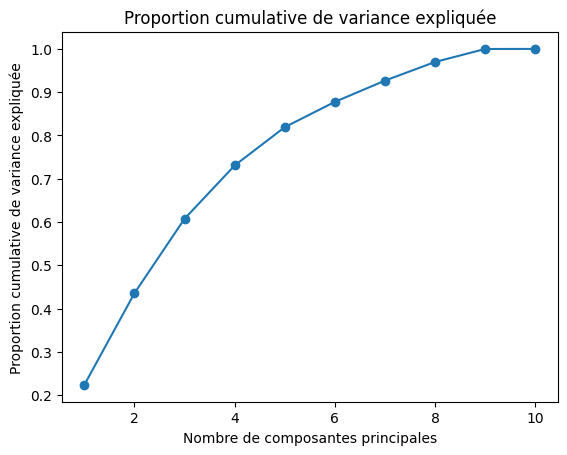

In [28]:
std_scaler = preprocessing.StandardScaler().fit(X_private)
X_scaled_private = std_scaler.transform(X_private)

# Analyse en composantes principales totale
pca_tot_p = decomposition.PCA(n_components=10)
pca_tot_p.fit(X_scaled_private)

# Visualisation de la variance expliquée cumulée
plt.figure()
plt.plot(np.arange(1, 11), np.cumsum(pca_tot_p.explained_variance_ratio_), marker='o')
plt.xlabel("Nombre de composantes principales")
plt.ylabel("Proportion cumulative de variance expliquée")
plt.title("Proportion cumulative de variance expliquée")

Pour 2 variables, la proportion cumulative de variance expliquée pour les deux premières PCA est légèrement moins bonne sur le jeu de test que sur le jeu d'entraînement.

#### Bonus 2
La plupart des modèles de classification binaire retournent la valeur 0 ou 1 après seuillage d'un score qui est d'autant plus élevé que la probabilité que l'étiquette soit 1 est grande. (Certains algorithmes, comme la régression logistique, modélisent directement cette probabilité. D'autres, comme les SVM, retournent un score qui peut dépasser 1.) 

Ainsi peut se poser la question du choix du seuil à utiliser (par défaut, 0.5 quand on modélise une probabilité).

La **courbe ROC** fait partie des outils qui permettent de visualiser la performance d'un modèle _pour tous les seuils possibles_.
    
Dans scikit-learn, les méthodes `predict_proba()` retournent des prédictions non seuillés, tandis que les méthodes `predict()` retournent des prédictions binaires obtenues après seuillage. L'affichage des courbes ROC se fait grâce au module [metrics.plot_roc_curve](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_roc_curve.html).

Affichez (sur le même graphique) et comparez les courbes ROC pour les prédictions en validation croisée obtenues pour les différents modèles.

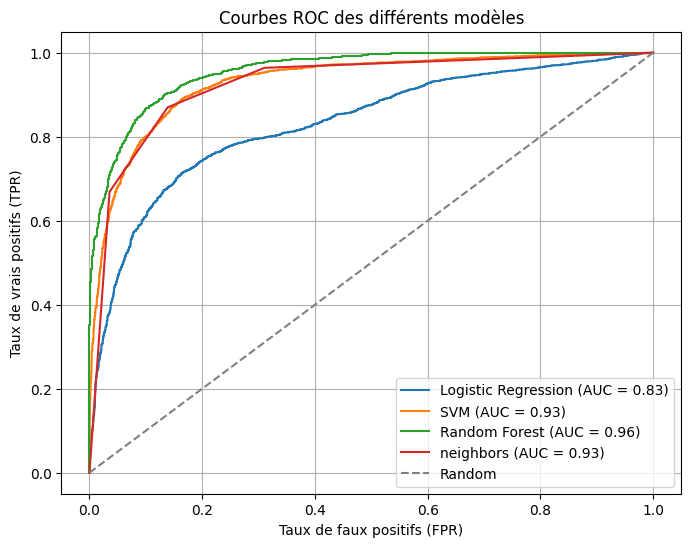

In [40]:
# Définir les meilleurs modèles avec les meilleurs paramètres obtenus précédemment
logistic_modelROC = linear_model.LogisticRegression()
svm_modelROC = svm.SVC(C=10, gamma=0.1, kernel='rbf', probability=True)
rf_modelROC = RandomForestClassifier(n_estimators=450, max_depth=10, random_state=42)
neighbors_modelROC = neighbors.KNeighborsClassifier(n_neighbors=3)

models = {'Logistic Regression': logistic_modelROC,
          'SVM': svm_modelROC,
          'Random Forest': rf_modelROC,
         'neighbors' : neighbors_modelROC}

# Initialiser la figure pour les courbes ROC
plt.figure(figsize=(8, 6))

for name, model in models.items():
    # Obtenir les prédictions de probabilité avec validation croisée
    y_probas = model_selection.cross_val_predict(model, X_scaled, y_public, cv=kf, method='predict_proba')
    
    # Extraire les probabilités de la classe positive
    y_scores = y_probas[:, 1]
    
    # Calculer les valeurs ROC
    fpr, tpr, thresholds = metrics.roc_curve(y_public, y_scores)
    roc_auc = metrics.auc(fpr, tpr)
    
    # Tracer la courbe ROC
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

# Tracer la ligne en pointillés représentant le hasard (random)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')

# Ajouter des labels et légendes
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbes ROC des différents modèles')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

Analyse : selon ces courbes, les performances de la régression logitique sont bien en dessous de celles du SVM et des 3-plus proches voisins, elles mêmes en dessous de celle de la forêt aléatoire. Les performances des 3 derniers algorithmes sont toutes très satisfaisantes pour les prédictions.

#### Bonus 3

Pour aller plus loin dans la visualisation des données :
* visualisez plus de 2 composantes principales, toujours par paires (PC3 vs PC1, PC3 vs PC2, etc.). Les classes vous semblent-elles facilement séparables ?
* visualisez et interprétez la contribution de chacune des variables à chaque composante principale. 

#### Réponse question a

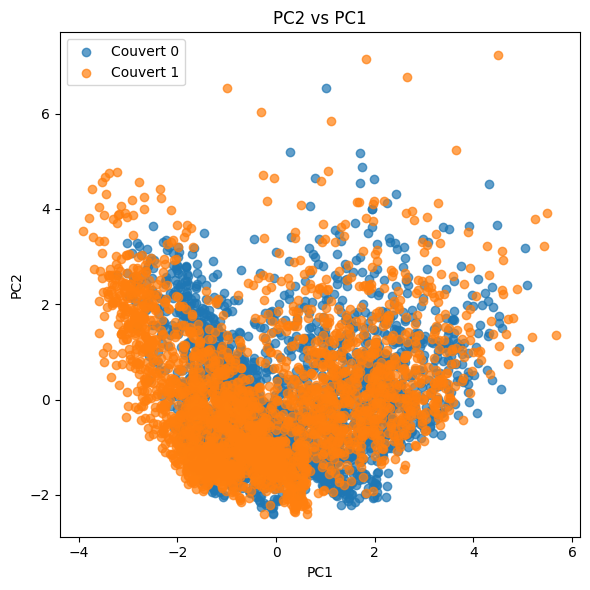

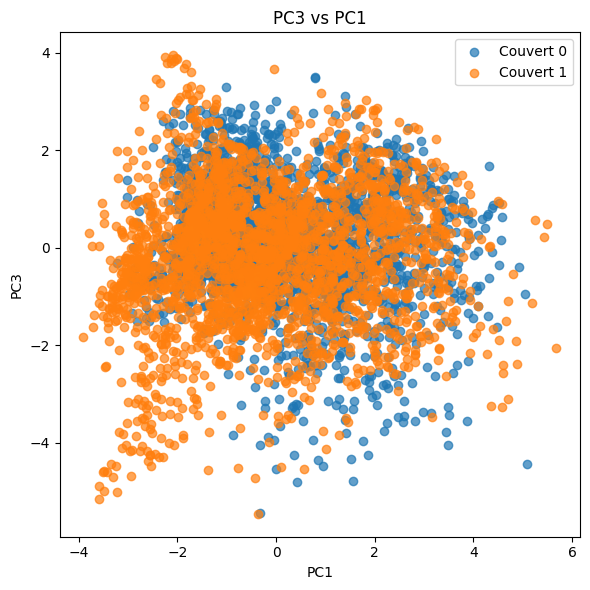

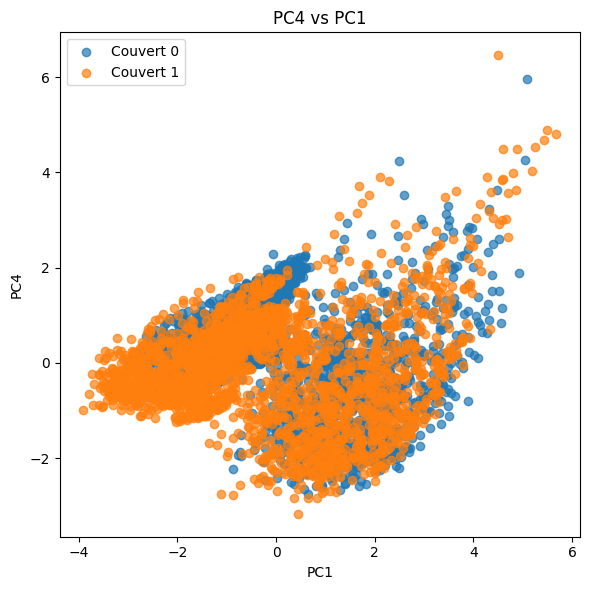

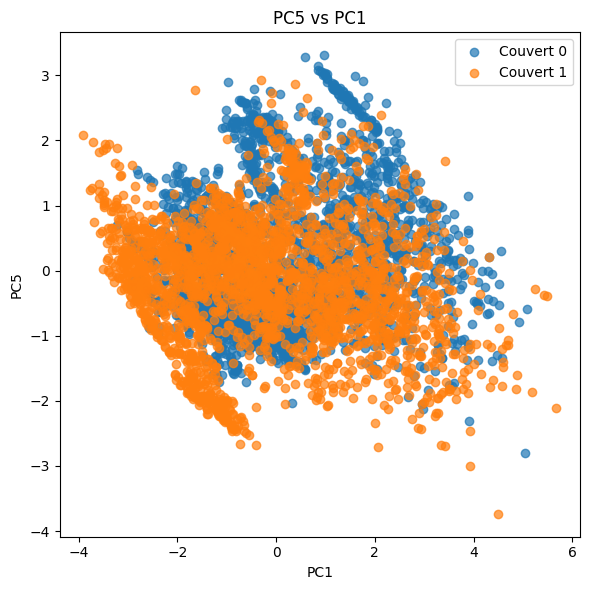

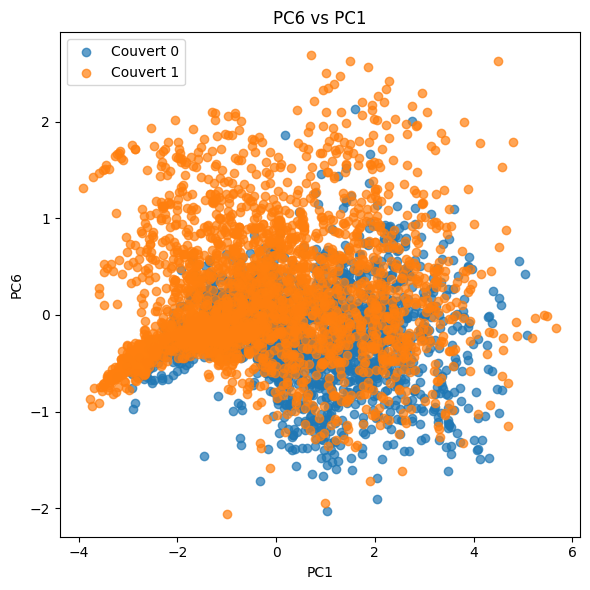

...

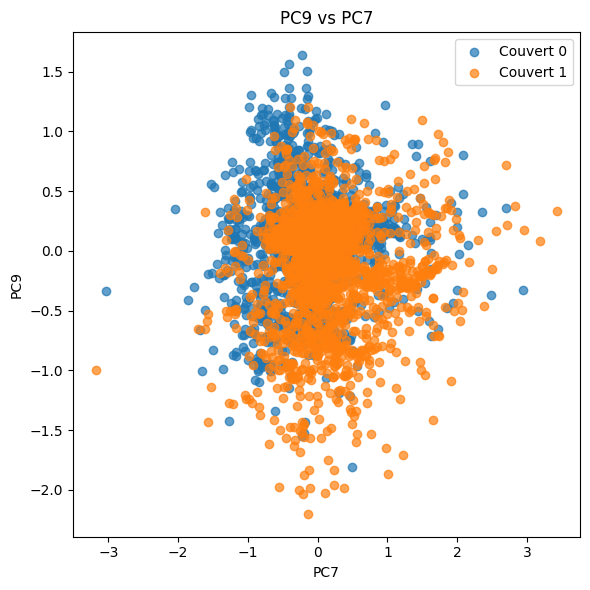

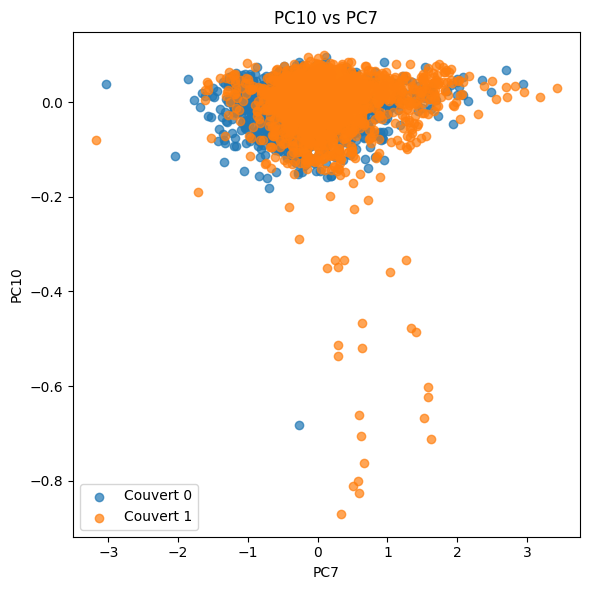

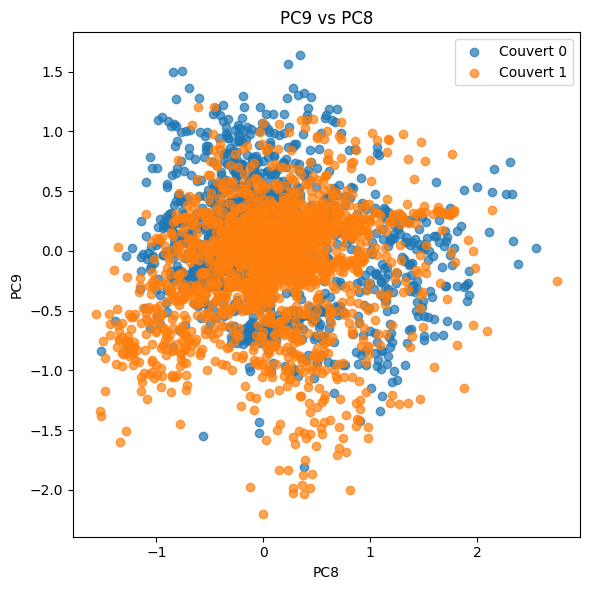

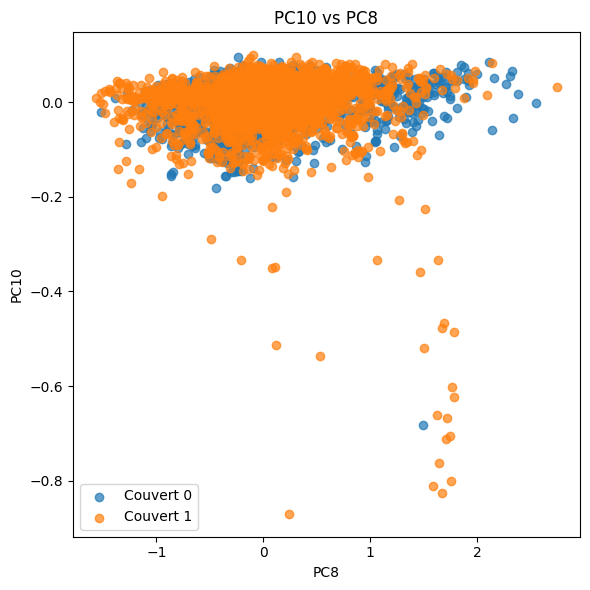

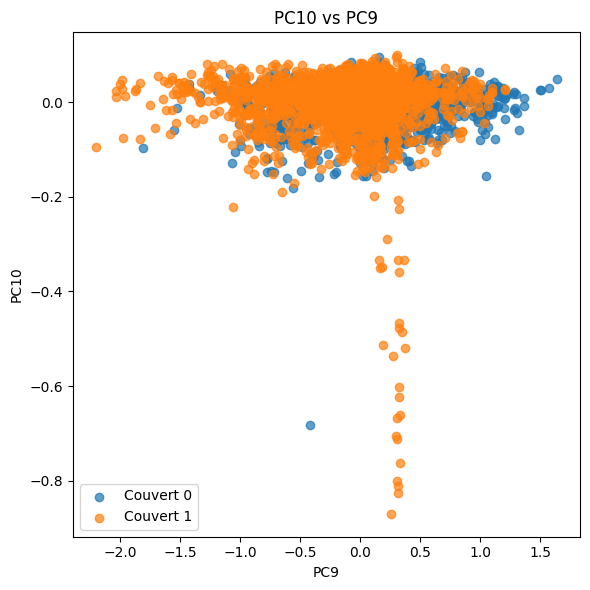

In [117]:
X_pca = pca_tot.fit_transform(X_scaled)
# Créer un DataFrame pour les données PCA
df_pca = pd.DataFrame(data=X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Ajouter les étiquettes (classes)
df_pca['couvert'] = y_public

# Définir les paires de composantes principales à tracer
pc_pairs = [(i, j) for i in range(pca_tot.n_components_) for j in range(i+1, pca_tot.n_components_)]

for idx, (pc1, pc2) in enumerate(pc_pairs):
    plt.figure(figsize=(6, 6))  # Taille du graphique en pouces (largeur, hauteur)
    plt.scatter(df_pca.loc[df_pca['couvert']==0, f'PC{pc1+1}'], df_pca.loc[df_pca['couvert']==0, f'PC{pc2+1}'], label='Couvert 0', alpha=0.7)
    plt.scatter(df_pca.loc[df_pca['couvert']==1, f'PC{pc1+1}'], df_pca.loc[df_pca['couvert']==1, f'PC{pc2+1}'], label='Couvert 1', alpha=0.7)
    plt.xlabel(f'PC{pc1+1}')
    plt.ylabel(f'PC{pc2+1}')
    plt.title(f'PC{pc2+1} vs PC{pc1+1}')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [127]:
pcs = pca_tot.components_
print(pcs[0])

[ 0.48159106 -0.19643034  0.39970524  0.20428647  0.01933208  0.07436494
  0.30230488  0.14857976 -0.47842091 -0.42394966]


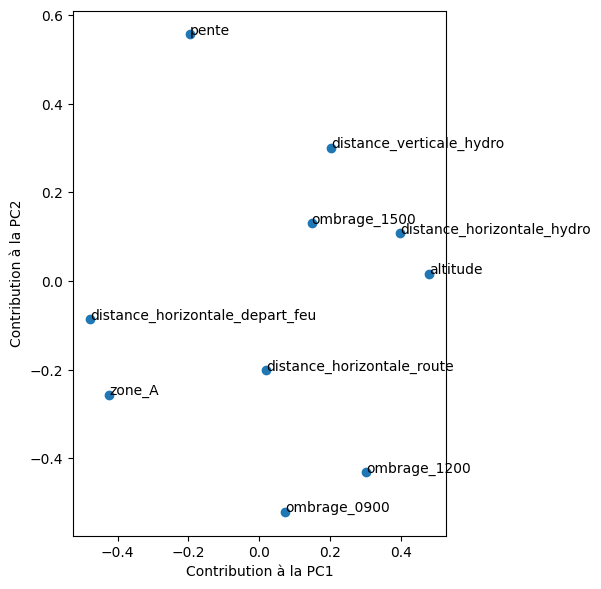

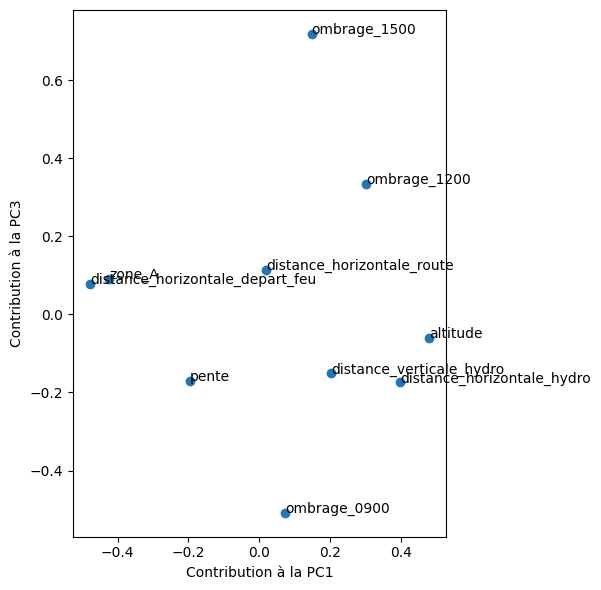

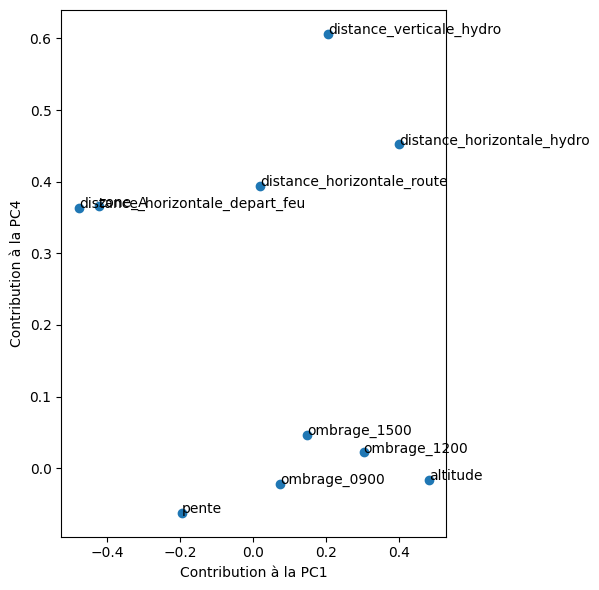

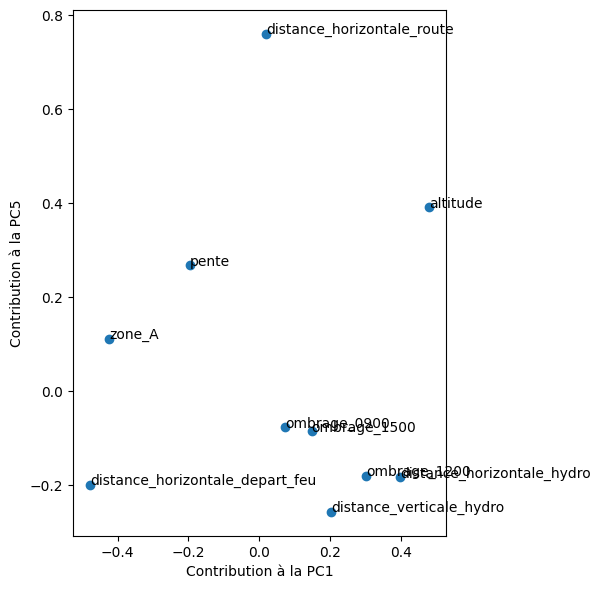

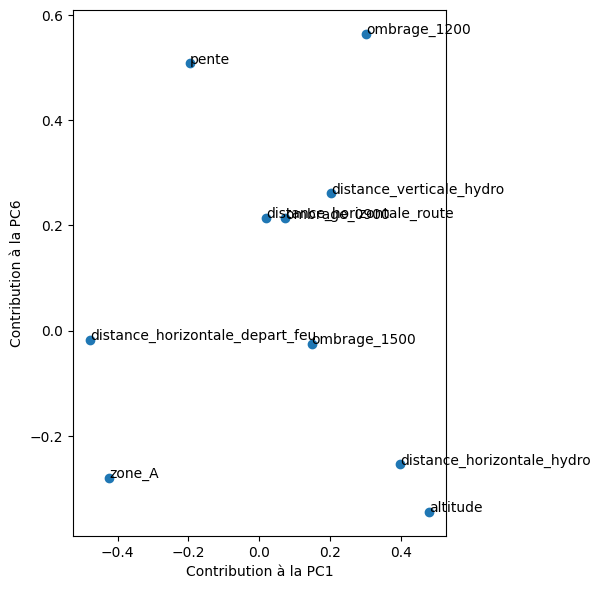

...

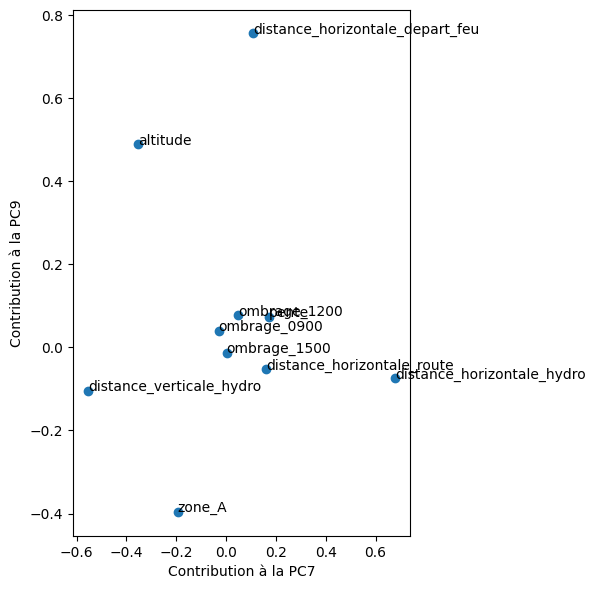

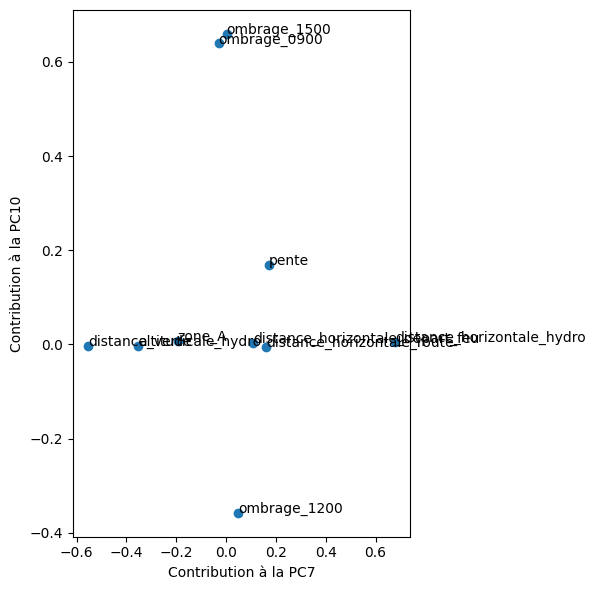

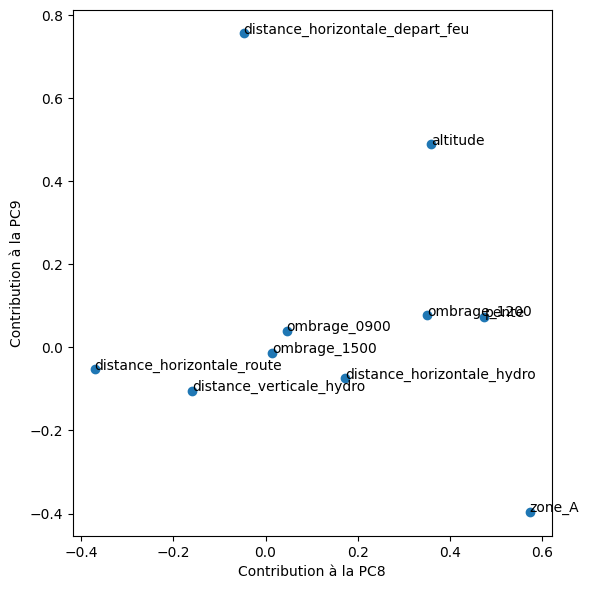

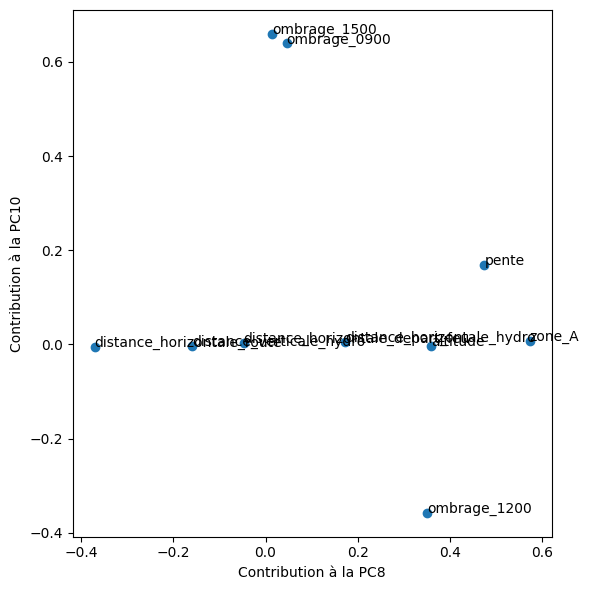

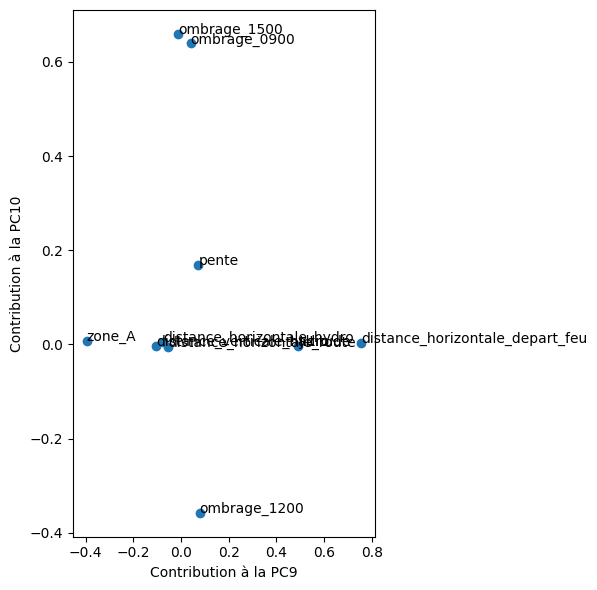

In [128]:
for (pc1, pc2) in pc_pairs :
    
        fig = plt.figure(figsize=(6, 6))
    
        plt.scatter(pcs[pc1], pcs[pc2])
    
        for (x_coordinate, y_coordinate, feature_name) in zip(pcs[pc1], pcs[pc2], df_public.columns[:10]):
            plt.text(x_coordinate, y_coordinate, feature_name)                          
            
        plt.xlabel(f"Contribution à la PC{pc1 + 1}")
        plt.ylabel(f"Contribution à la PC{pc2 + 1}")
        plt.tight_layout()
        plt.show()

Les classes n'ont pas l'air facilement séparables

#### Réponse question b

In [122]:
for i in range(10):
    print(f"Variable {i + 1}:")
    print(df_public.columns[:10][i])
    print()

Variable 1:
altitude

Variable 2:
pente

Variable 3:
distance_horizontale_hydro

Variable 4:
distance_verticale_hydro

Variable 5:
distance_horizontale_route

Variable 6:
ombrage_0900

Variable 7:
ombrage_1200

Variable 8:
ombrage_1500

Variable 9:
distance_horizontale_depart_feu

Variable 10:
zone_A



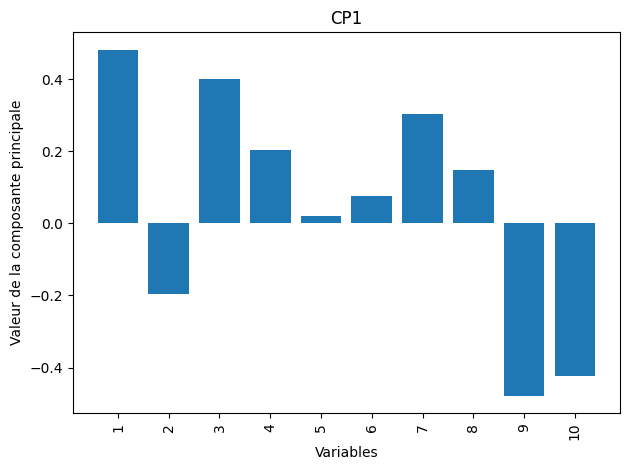

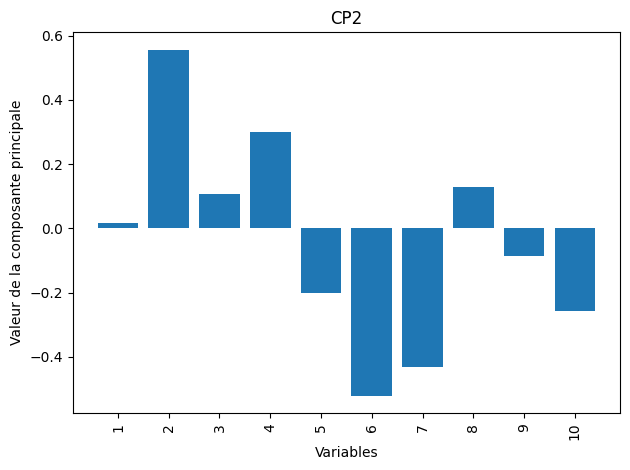

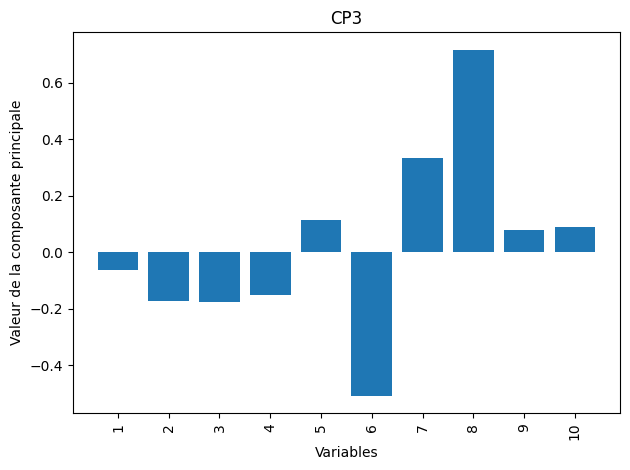

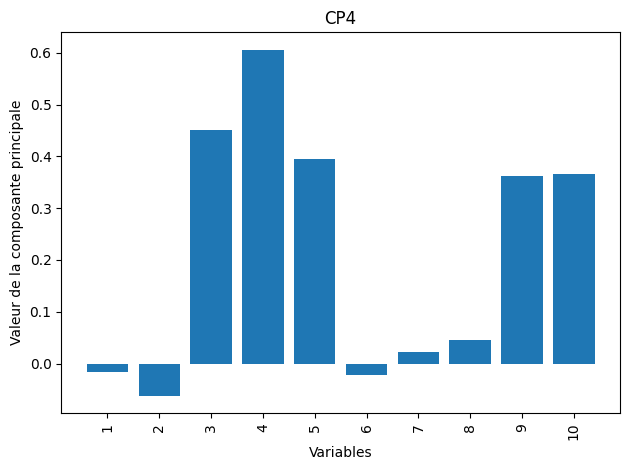

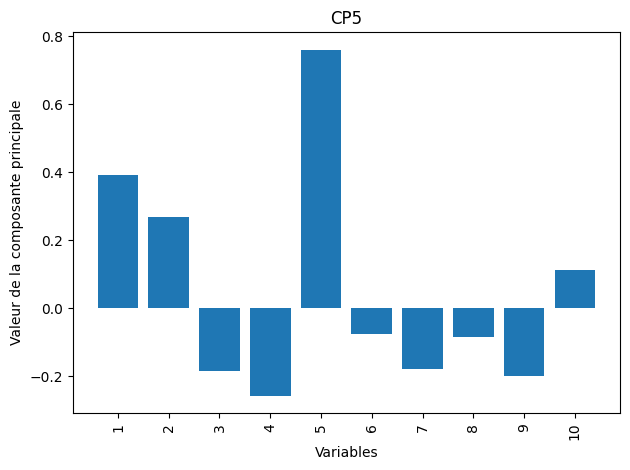

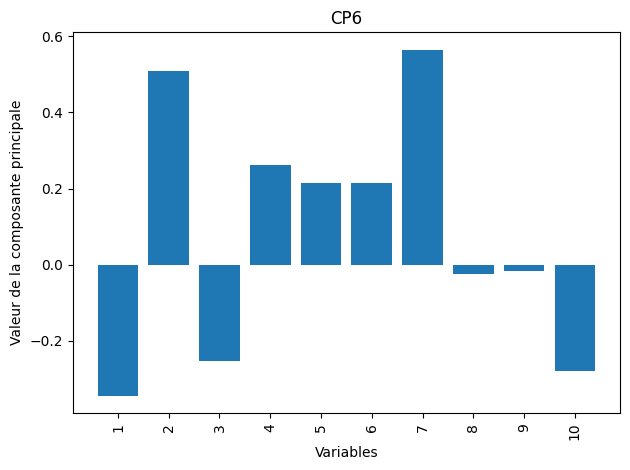

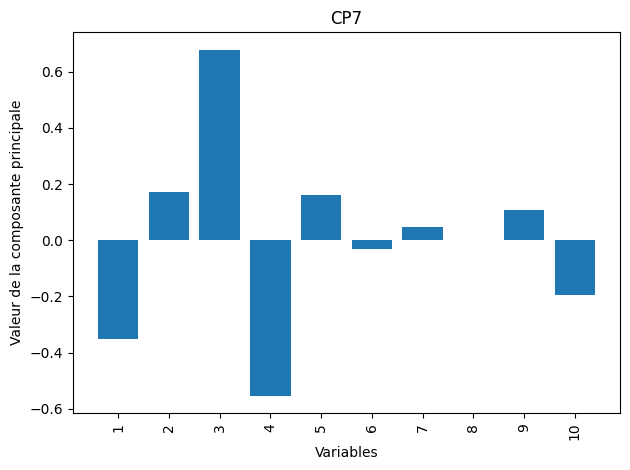

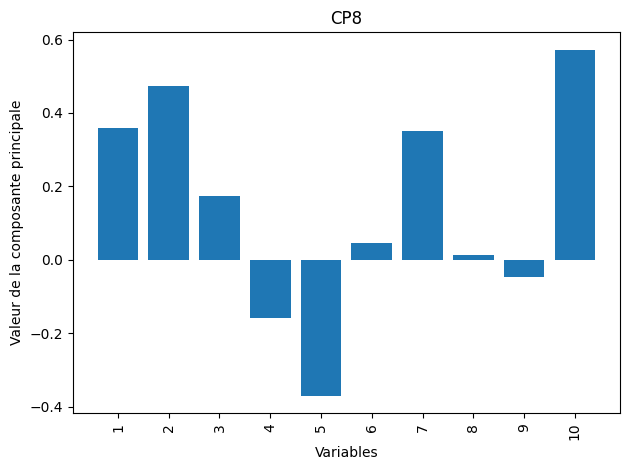

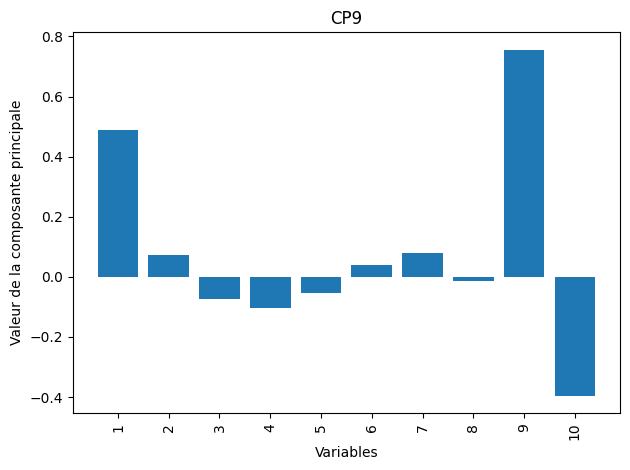

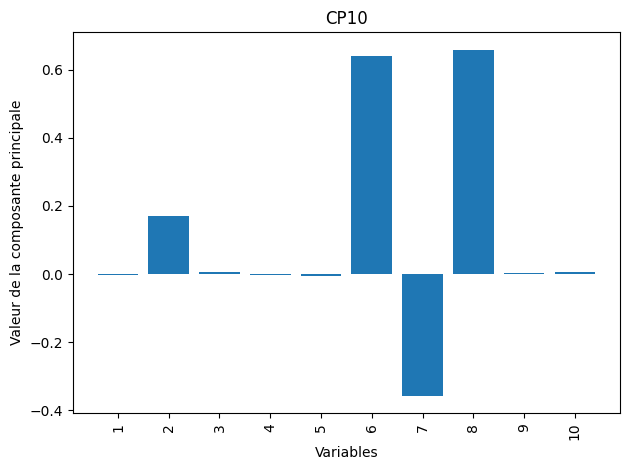

In [124]:
variable_names = [str(i) for i in range(1, 11)] 

# Boucle sur chaque composante principale
for i in range(10):
    plt.bar(variable_names, pcs[i], align='center')
    plt.xticks(rotation=90)
    plt.xlabel('Variables')
    plt.ylabel('Valeur de la composante principale')
    plt.title(f'CP{i + 1}')

    plt.tight_layout()
    plt.show()


Analyse : il n'est pas évident d'interpréter ces résultats. Description de diagrammes ci-dessus pour les 4 premières CP : 

CP1 : forte contribution négative de la distance horizontale du départ de feu le plus proche et de la zone géographique. 
Forte contribution positive de l'altitude, la distance horizontale au point d'eau le plus proche et l'ombrage à midi.

CP2 : forte contribution positive de la pente, négative de l'ombrage à 9h et 12h. 

CP3 : ces composantes semblent être liées à l'ombrage.

CP4 : cette composante semble mesurer des critères géographiques (distances à route/point d'eau/ départ de feu les plus proches de la zone + zone géographique), avec les mêmes poids.

On va essayer d'étudier des corrélations entre variables dans la suite, en étant guidés par l'ACP.

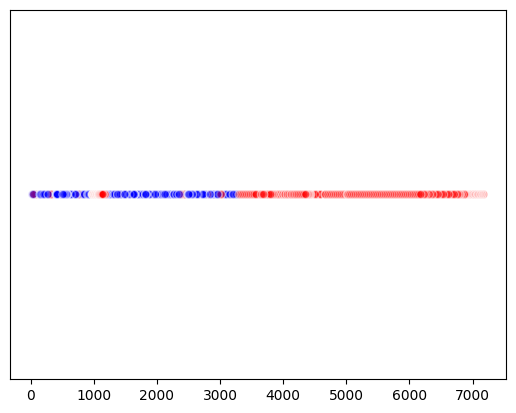

In [182]:
# Extraire les valeurs des colonnes
x = df_public['distance_horizontale_depart_feu'].values
y = df_public['zone_A'].values

# Définir les couleurs basées sur les valeurs de y
colors = ['red' if label == 1 else 'blue' for label in y]

# Tracer les valeurs de x avec les couleurs définies et transparence
plt.scatter(x, [0]*len(x), c=colors, alpha=0.5, label='distance_horizontale_depart_feu', edgecolors='w')
plt.yticks([])  # Masquer les étiquettes de l'axe y
plt.show()

Corrélation croissante entre ces deux variables : les points dont distance_horizontale_depart_feu est supérieur à 3km sont majoritairement situés dans la zone A. Inversement les points dont distance_horizontale_depart_feu sont hors de la zone A.

Text(0, 0.5, 'altitude')

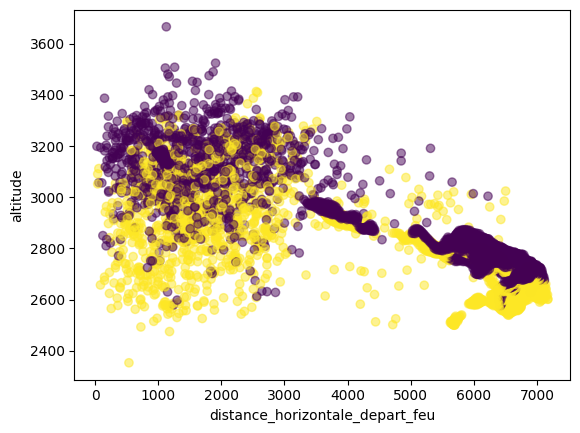

In [171]:
# Extraire les valeurs des colonnes
x = df_public['distance_horizontale_depart_feu'].values
y = df_public['altitude'].values

plt.scatter(x, y, alpha=0.5, c=df_public['couvert'])

# Ajouter les détails du graphique
plt.xlabel('distance_horizontale_depart_feu')
plt.ylabel('altitude')

L'altitude sur des zones à distances horizontales de départ de feu de moins de 3000m semble bien séparer nos données.

D'après l'analyse précédente cela semble à peu près correspondre à des points hors de la zone A.

Text(0, 0.5, 'altitude')

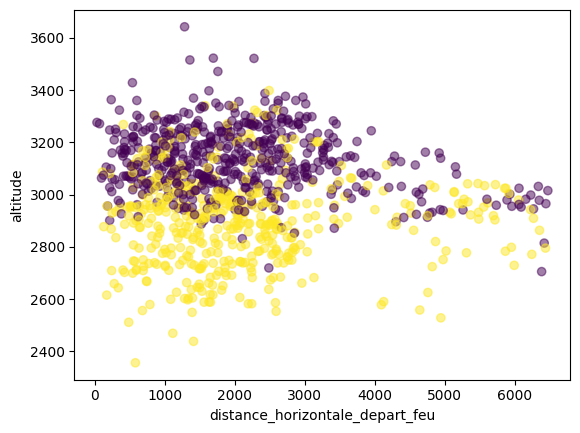

In [209]:
# Extraire les valeurs des colonnes
x = df_private['distance_horizontale_depart_feu'].values
y = df_private['altitude'].values

plt.scatter(x, y, alpha=0.5, c=y_pred_final)

# Ajouter les détails du graphique
plt.xlabel('distance_horizontale_depart_feu')
plt.ylabel('altitude')

Mon hypothèse précédente se vérifie pour mes prédictions sur le jeu de test !

Text(0, 0.5, 'distance_horizontale_hydro')

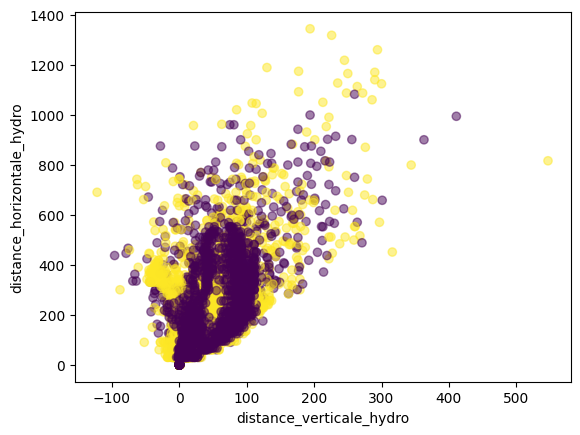

In [183]:
# Extraire les valeurs des colonnes
x = df_public['distance_verticale_hydro'].values
y = df_public['distance_horizontale_hydro'].values

plt.scatter(x, y, alpha=0.5, c=df_public['couvert'])

# Ajouter les détails du graphique
plt.xlabel('distance_verticale_hydro')
plt.ylabel('distance_horizontale_hydro')

Corrélation croissante entre ces deux variables plutôt attendue, les valeurs de distance horizontale sont plus étalées que celles de distance verticales.

Text(0, 0.5, 'ombrage_1200')

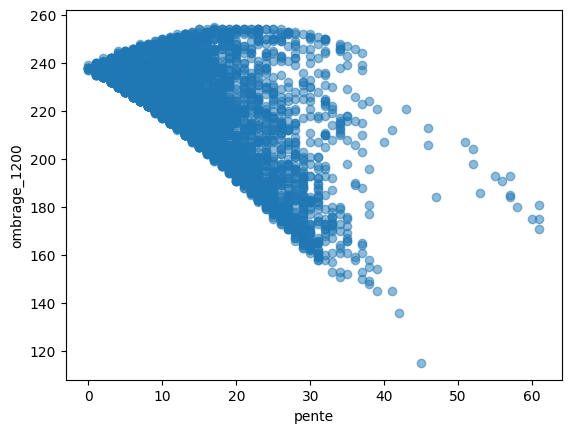

In [189]:
# Extraire les valeurs des colonnes
x = df_public['pente'].values
y = df_public['ombrage_1200'].values
plt.scatter(x, y, alpha=0.5)

# Ajouter les détails du graphique
plt.xlabel('pente')
plt.ylabel('ombrage_1200')


Corrélation négative entre ces deux variables, plutôt attendue.

Text(0, 0.5, 'ombrage_1500')

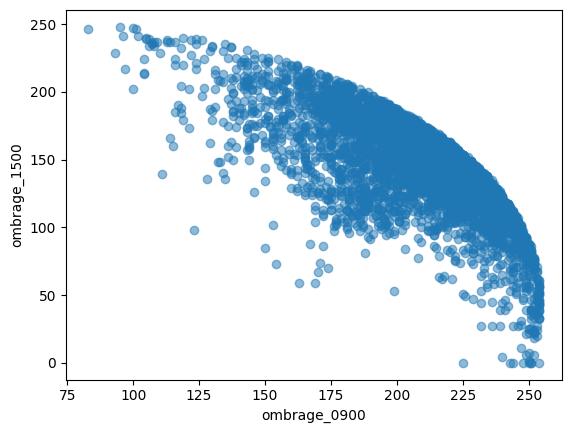

In [177]:
# Extraire les valeurs des colonnes
x = df_public['ombrage_0900'].values
y = df_public['ombrage_1500'].values
plt.scatter(x, y, alpha=0.5)

# Ajouter les détails du graphique
plt.xlabel('ombrage_0900')
plt.ylabel('ombrage_1500')

Corrélation négative entre ces deux variables, plutôt attendue.

#### Bonus 4

Utilisez d'autres algorithmes non-linéaires.

Voir à la question 12.